# AstroGraphAnomaly — A→H Visualization Suite

Ce notebook exécute un run (CSV) puis génère la galerie A→H dans `results/<run>/viz_a_to_h/`.

**Pré-requis**: `requirements.txt` + `requirements_viz.txt`.


In [1]:
!git clone --depth 1 https://github.com/dalozedidier-dot/AstroGraphAnomaly.git
%cd AstroGraphAnomaly
!python -m pip install -q --upgrade pip
!pip -q install -r requirements.txt
!pip -q install -r requirements_viz.txt


Cloning into 'AstroGraphAnomaly'...
remote: Enumerating objects: 104, done.
remote: Counting objects: 100% (104/104), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 104 (delta 9), reused 80 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (104/104), 185.26 KiB | 3.09 MiB/s, done.
Resolving deltas: 100% (9/9), done.
/content/AstroGraphAnomaly
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 17.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [4]:
# 1) Run pipeline (offline CSV)
import os

!mkdir -p results/run_csv

if os.path.exists('workflow.py'):
  !python workflow.py csv --in-csv data/sample_gaia_like.csv --out results/run_csv --top-k 50 --knn-k 10 --plots --explain-top 10 --features-mode extended
else:
  !python run_workflow.py --mode csv --in-csv data/sample_gaia_like.csv --out results/run_csv --top-k 50 --knn-k 10 --plots --explain-top 10 --features-mode extended

/content/AstroGraphAnomaly/src/astrographanomaly/reporting/plots.py:311: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


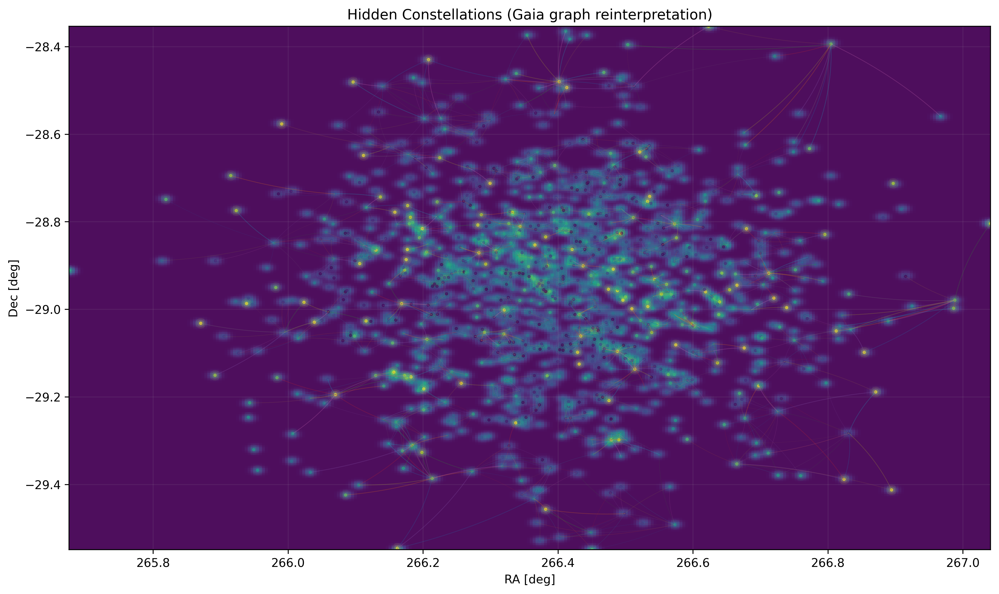

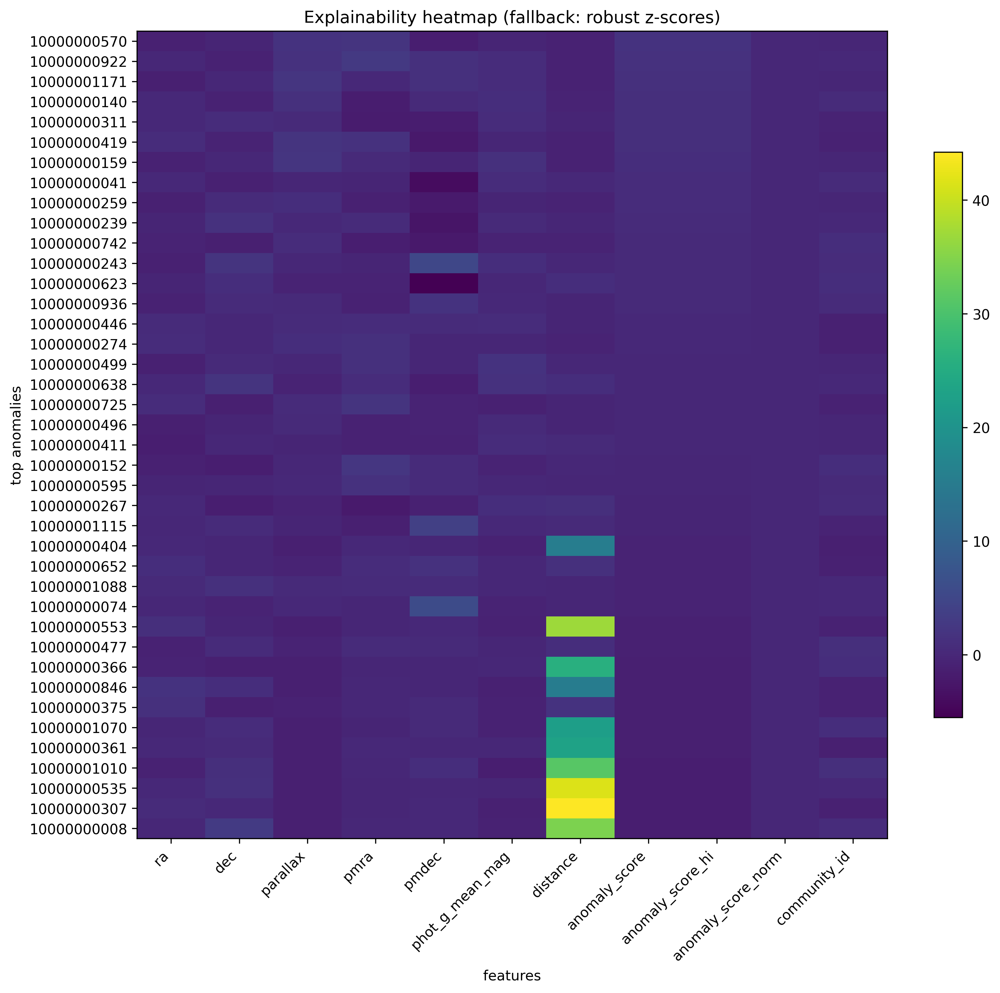

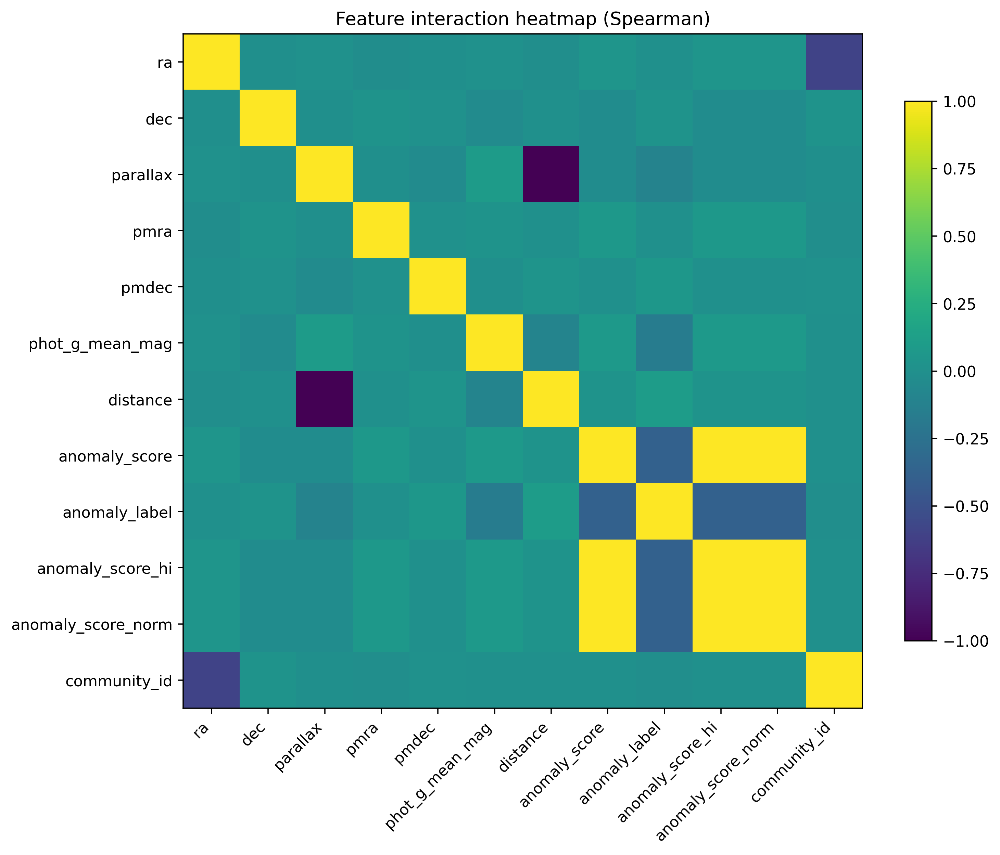

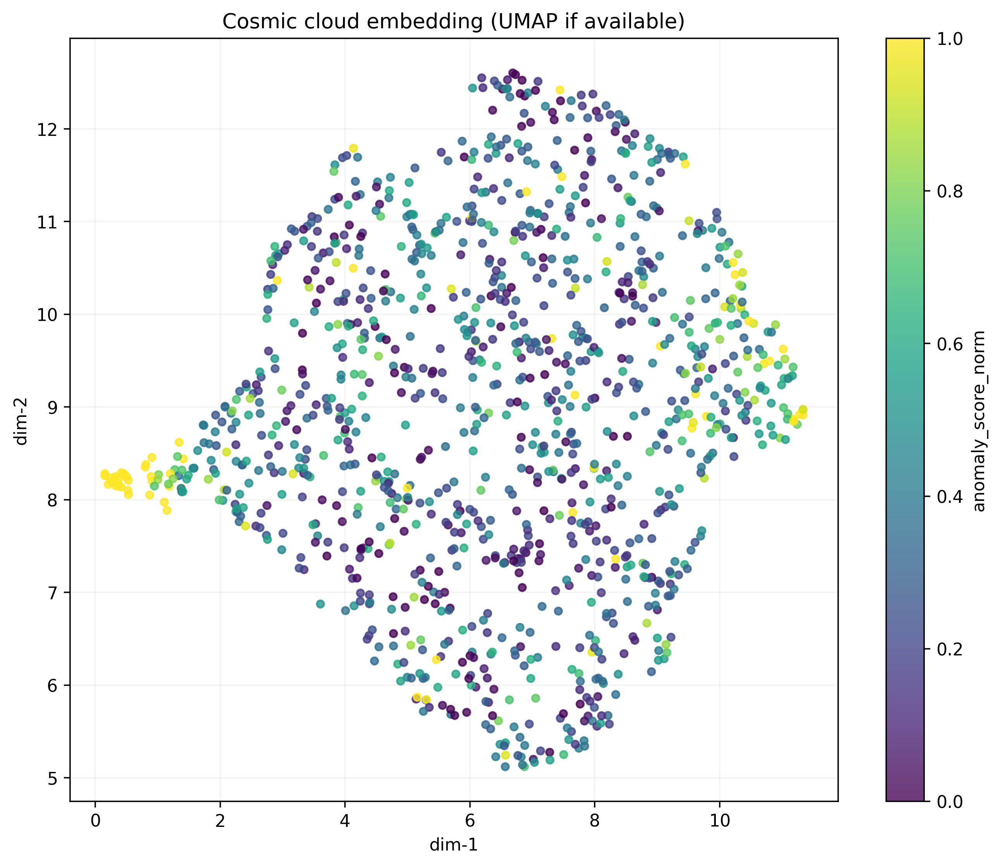

Open dashboard: results/run_csv/viz_a_to_h/06_explorer_dashboard.html


In [10]:
# 3) Preview key artifacts
from pathlib import Path
from IPython.display import Image, display
p = Path('results/run_csv/viz_a_to_h')
for name in ['01_hidden_constellations_sky.png','04_explainability_heatmap.png','05_feature_interaction_heatmap.png','09_umap_cosmic_cloud.png']:
    f = p/name
    if f.exists():
        display(Image(filename=str(f)))
print('Open dashboard:', p/'06_explorer_dashboard.html')

In [11]:
from IPython.display import display, HTML
file_path = 'results/run_csv/viz_a_to_h/02_celestial_sphere_3d.html'
display(HTML(f'<a href="{file_path}" target="_blank">Click here to open 02_celestial_sphere_3d.html</a>'))

In [9]:
# 2) A→H gallery
!sed -i 's/fig.canvas.tostring_rgb()/fig.canvas.tostring_argb()/g' tools/viz_a_to_h_suite.py
!sed -i '/img = img.reshape/s/(3,)/(4,)/g' tools/viz_a_to_h_suite.py
!python tools/viz_a_to_h_suite.py --run-dir results/run_csv --scored results/run_csv/scored.csv --graph results/run_csv/graph_full.graphml --explain results/run_csv/explanations.jsonl
!ls -la results/run_csv/viz_a_to_h | sed -n '1,200p'

2026-02-08 15:25:50.000981: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-02-08 15:25:50.005812: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-02-08 15:25:50.019688: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1770564350.043402    3034 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1770564350.050264    3034 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1770564350.068107    3034 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

In [5]:
!ls -la results/run_csv/viz_a_to_h

ls: cannot access 'results/run_csv/viz_a_to_h': No such file or directory


In [12]:
# 2) A→H gallery
!python tools/viz_a_to_h_suite.py --run-dir results/run_csv --scored results/run_csv/scored.csv --graph results/run_csv/graph_full.graphml --explain results/run_csv/explanations.jsonl
!ls -la results/run_csv/viz_a_to_h | sed -n '1,200p'


2026-02-08 15:30:30.541539: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-02-08 15:30:30.546269: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-02-08 15:30:30.560273: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1770564630.584948    4172 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1770564630.591808    4172 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1770564630.609775    4172 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

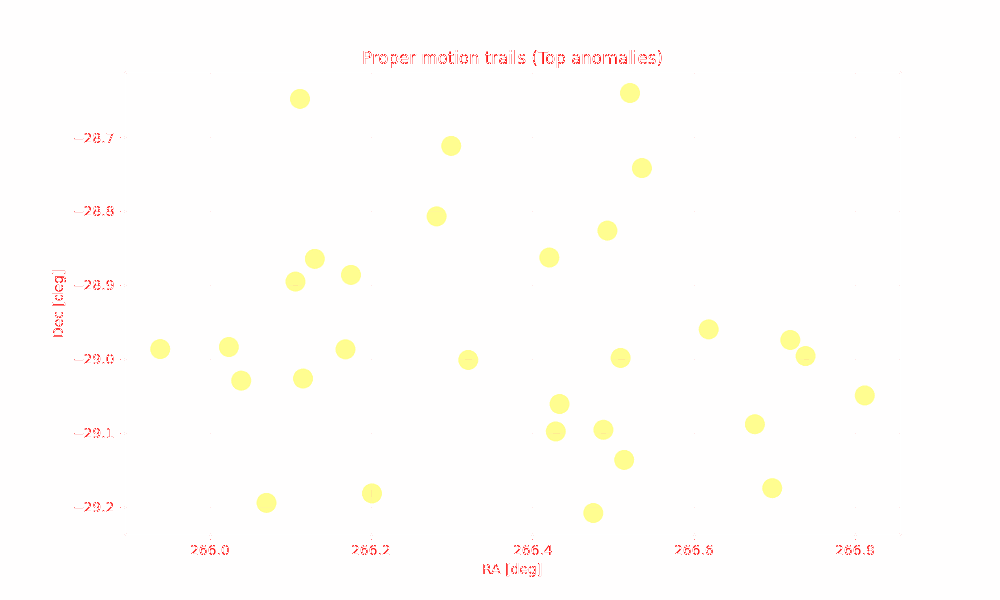

In [14]:
from IPython.display import Image, display
file_path = 'results/run_csv/viz_a_to_h/07_proper_motion_trails.gif'
display(Image(filename=file_path))

In [29]:
from IPython.display import display, HTML
file_path = 'results/run_csv/viz_a_to_h/06_explorer_dashboard.html'
display(HTML(f'<a href="{file_path}" target="_blank">Click here to open the Interactive Dashboard</a>'))

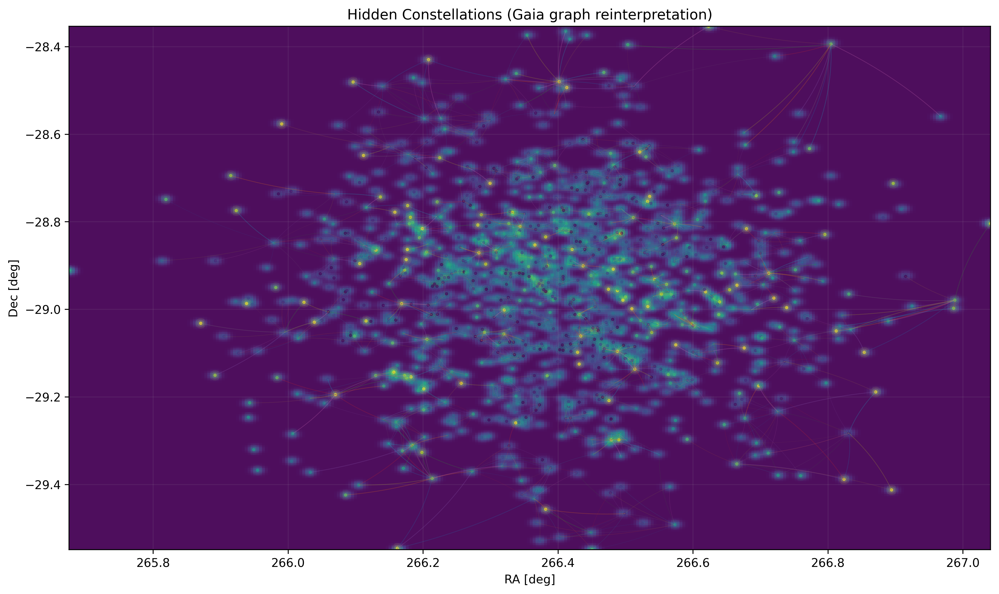

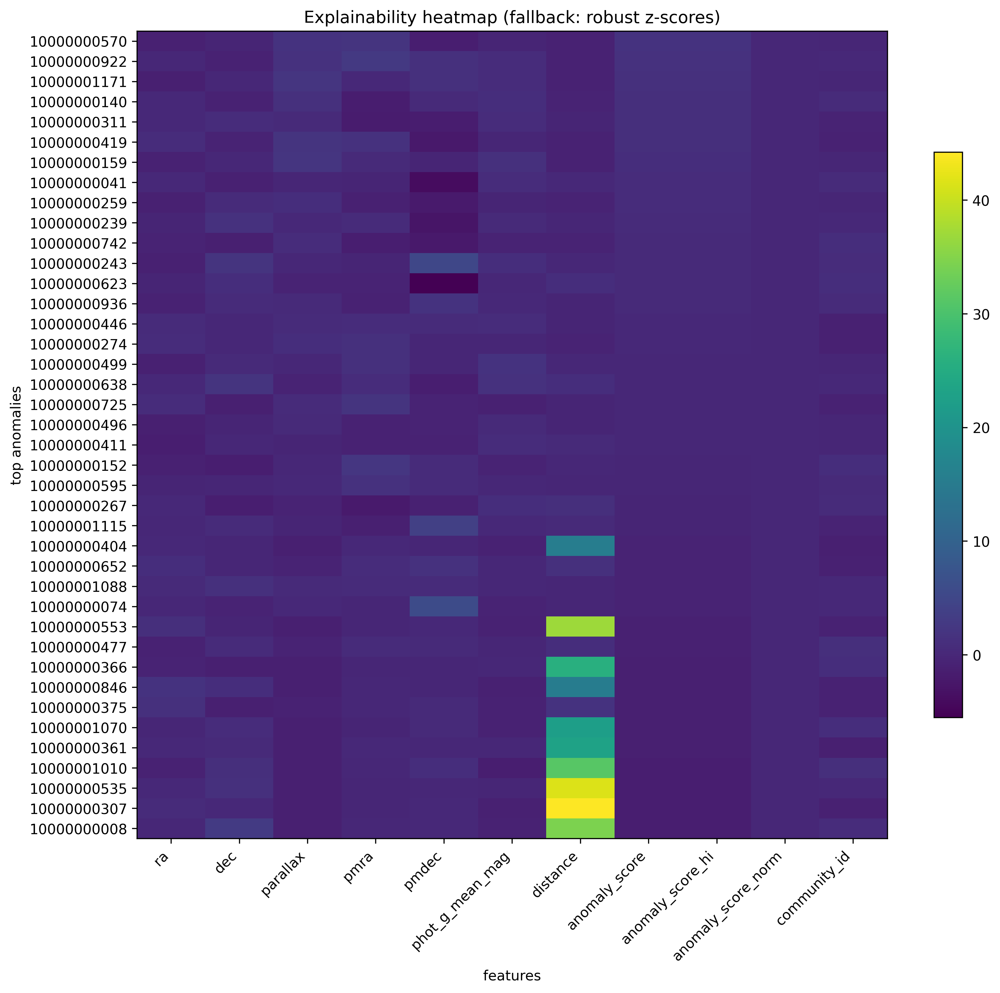

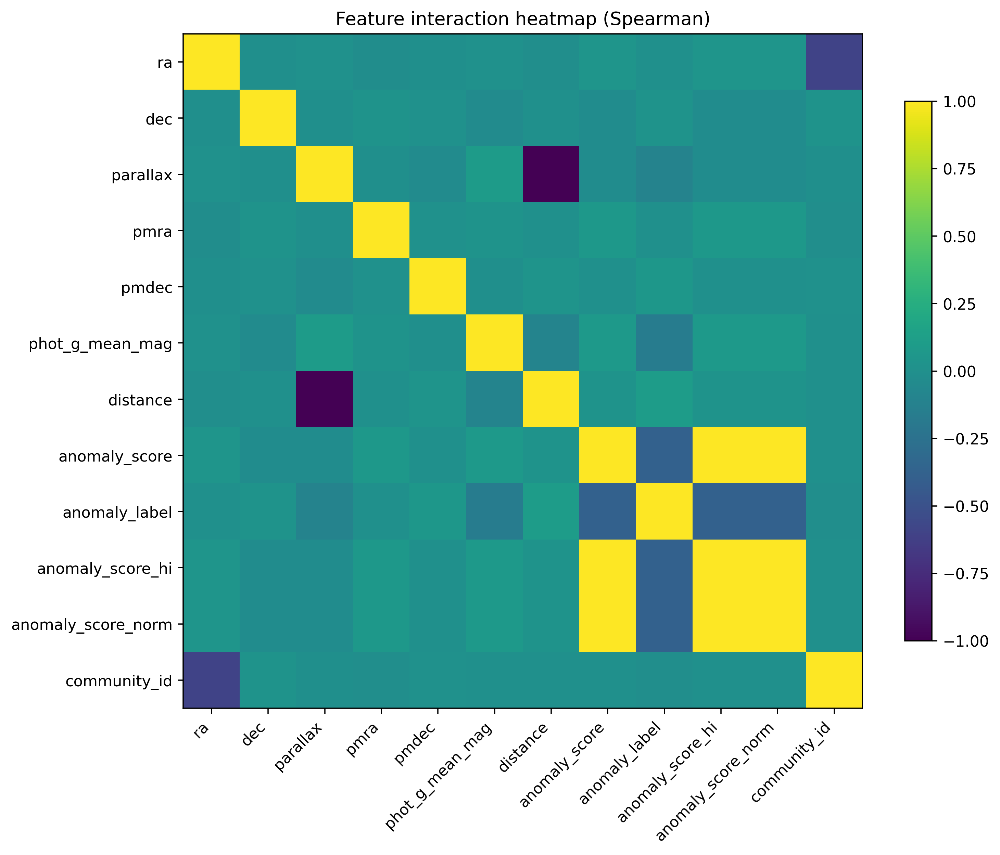

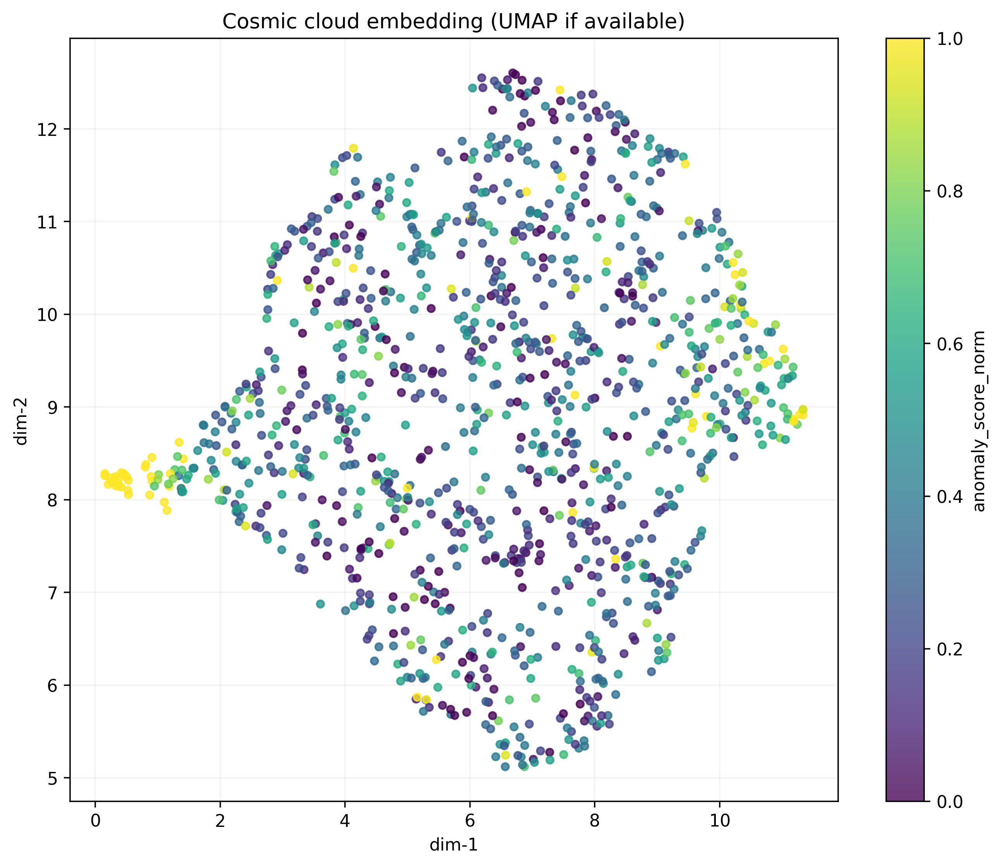

Open dashboard: results/run_csv/viz_a_to_h/06_explorer_dashboard.html


In [28]:
# 3) Preview key artifacts
from pathlib import Path
from IPython.display import Image, display
p = Path('results/run_csv/viz_a_to_h')

png_files = sorted(list(p.glob('*.png')))

if png_files:
    for f in png_files:
        display(Image(filename=str(f)))
else:
    print(f"No PNG files found in {p}")

print('Open dashboard:', p/'06_explorer_dashboard.html')

In [27]:
from pathlib import Path
from IPython.display import display, HTML

p = Path('results/run_csv/viz_a_to_h')

html_files = sorted(list(p.glob('*.html')))

if html_files:
    print(f"Found {len(html_files)} HTML files in {p}:")
    for f in html_files:
        display(HTML(f'<a href="{str(f)}" target="_blank">Click here to open {f.name}</a>'))
else:
    print(f"No HTML files found in {p}")

Found 5 HTML files in results/run_csv/viz_a_to_h:


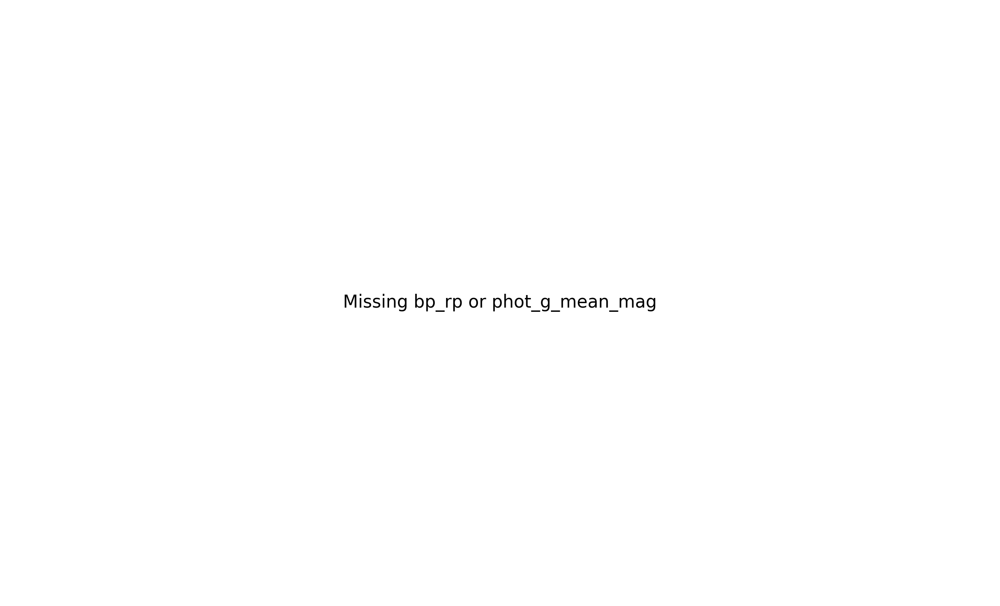

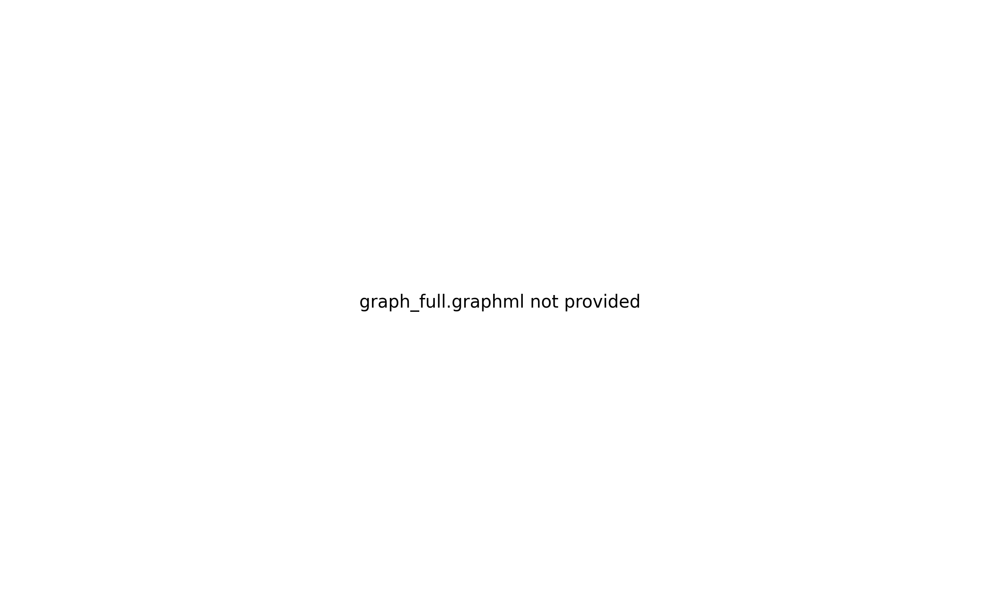

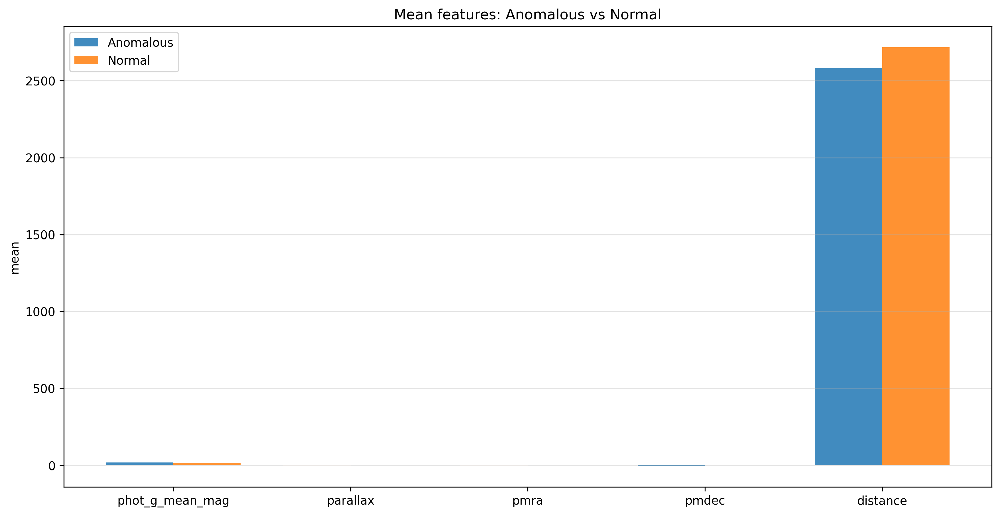

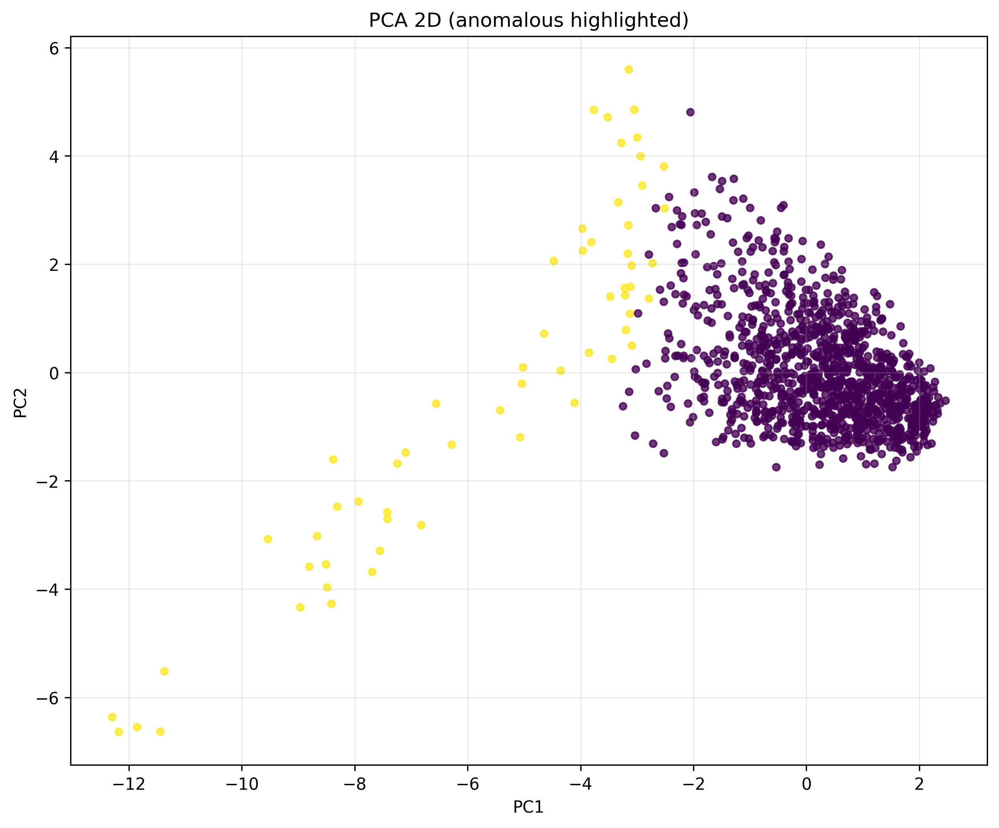

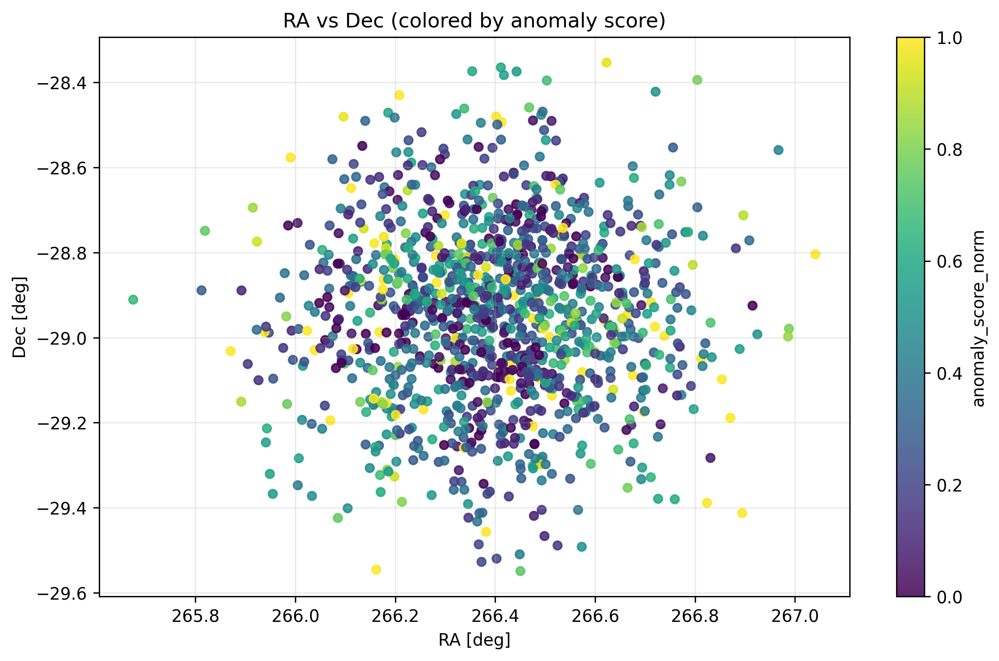

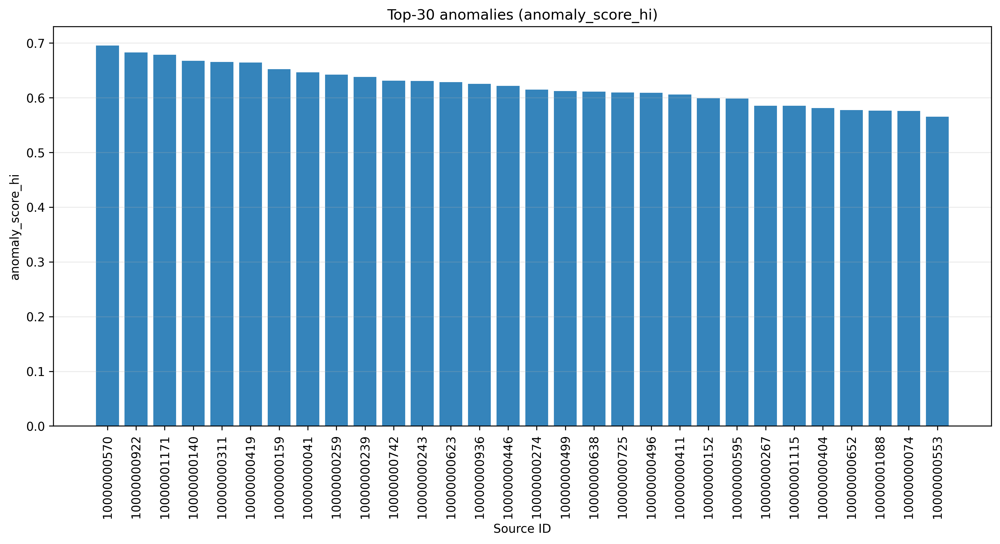

In [26]:
from pathlib import Path
from IPython.display import Image, display

p = Path('results/screenshots')

png_files = sorted(list(p.glob('*.png')))

if png_files:
    for f in png_files:
        display(Image(filename=str(f)))
else:
    print(f"No PNG files found in {p}")

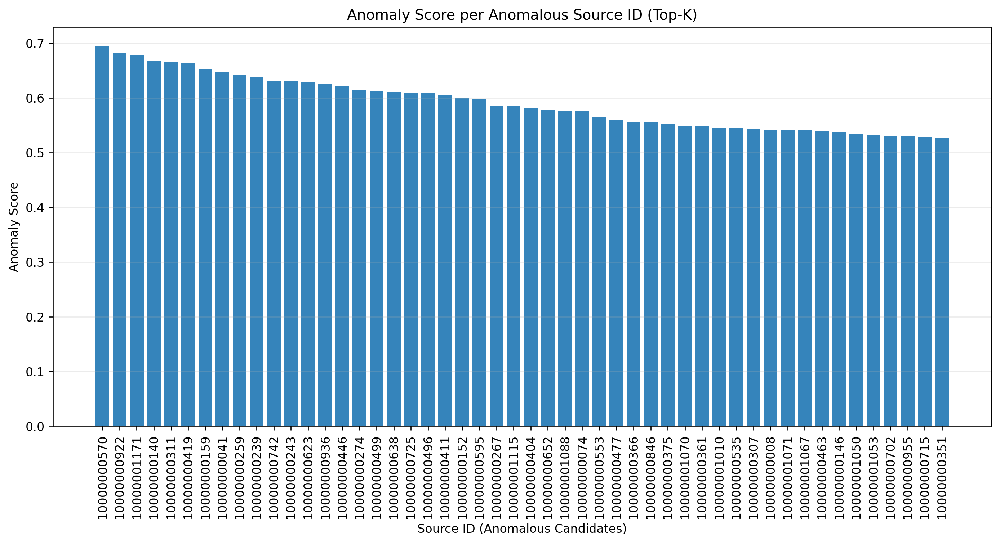

In [25]:
from IPython.display import Image, display
file_path = 'results/full_plots/top_anomalies_scores.png'
display(Image(filename=file_path))

In [24]:
!mkdir -p results/showcase
!mkdir -p results/screenshots
!python tools/showcase_plots.py \
    --scored results/run_csv/scored.csv \
    --out results/showcase \
    --copy-to-screenshots results/screenshots

OK: wrote 18 PNG -> results/showcase/plots


In [23]:
!ls -la results/full_plots

total 4496
drwxr-xr-x 2 root root    4096 Feb  8 17:28 .
drwxr-xr-x 4 root root    4096 Feb  8 17:27 ..
-rw-r--r-- 1 root root   22680 Feb  8 17:28 cmd_bp_rp_vs_g.png
-rw-r--r-- 1 root root 2461181 Feb  8 17:28 graph_communities_anomalies.png
-rw-r--r-- 1 root root  578091 Feb  8 17:28 mag_vs_distance.png
-rw-r--r-- 1 root root   88516 Feb  8 17:28 mean_features_anom_vs_normal.png
-rw-r--r-- 1 root root  472669 Feb  8 17:28 pca_2d.png
-rw-r--r-- 1 root root  771288 Feb  8 17:28 ra_dec_score.png
-rw-r--r-- 1 root root   57625 Feb  8 17:28 score_hist.png
-rw-r--r-- 1 root root  125133 Feb  8 17:28 top_anomalies_scores.png


In [22]:
!python tools/showcase_plots.py --help

usage: showcase_plots.py [-h] --scored SCORED [--graph GRAPH] --out OUT
                         [--plots-dir PLOTS_DIR] [--top-k TOP_K]
                         [--write-enriched]
                         [--copy-to-screenshots COPY_TO_SCREENSHOTS]

options:
  -h, --help            show this help message and exit
  --scored SCORED       Path to scored.csv
  --graph GRAPH         Path to graph_full.graphml (optional)
  --out OUT             Run output dir (contains scored.csv)
  --plots-dir PLOTS_DIR
                        Subdir under --out for PNGs
  --top-k TOP_K
  --write-enriched      Write scored_enriched.csv + graph_metrics.json if
                        graph present
  --copy-to-screenshots COPY_TO_SCREENSHOTS
                        Copy 6 curated PNG to this folder (e.g. screenshots/)


In [21]:
!mkdir -p results/full_plots
!sed -i 's/plt.colorbar(plt.cm.ScalarMappable(), label="Community ID")/plt.colorbar(plt.cm.ScalarMappable(), ax=plt.gca(), label="Community ID")/' tools/full_plots_suite.py
!python tools/full_plots_suite.py \
    --scored results/run_csv/scored.csv \
    --graph results/run_csv/graph_full.graphml \
    --out results/full_plots \
    --top-k 50 \
    --write-enriched

OK: wrote curated plots -> results/full_plots


In [19]:
!python tools/full_plots_suite.py --help

usage: full_plots_suite.py [-h] --scored SCORED [--graph GRAPH] --out OUT
                           [--top-k TOP_K] [--write-enriched]

options:
  -h, --help        show this help message and exit
  --scored SCORED   Path to scored.csv
  --graph GRAPH     Path to graph_full.graphml (optional)
  --out OUT         Output directory for PNGs
  --top-k TOP_K
  --write-enriched  Write scored_enriched.csv + graph_metrics.json


In [18]:
!python tools/run_full.py --help

usage: run_full.py [-h] {csv,gaia} ...

positional arguments:
  {csv,gaia}

options:
  -h, --help  show this help message and exit


In [17]:
!ls -l tools/

total 100
-rw-r--r-- 1 root root 13657 Feb  8 15:14 full_plots_suite.py
-rw-r--r-- 1 root root  6233 Feb  8 15:14 gaia_smoke_test.py
-rw-r--r-- 1 root root     0 Feb  8 15:14 __init__.py
-rw-r--r-- 1 root root  5357 Feb  8 15:14 post_analysis.py
-rw-r--r-- 1 root root  3503 Feb  8 15:14 run_full.py
-rw-r--r-- 1 root root  8615 Feb  8 15:14 run_max_all.py
-rw-r--r-- 1 root root 17887 Feb  8 15:14 showcase_plots.py
-rw-r--r-- 1 root root  1958 Feb  8 15:14 validate_outputs.py
-rw-r--r-- 1 root root 28373 Feb  8 15:25 viz_a_to_h_suite.py


In [15]:
# Create a zip archive of the visualizations directory
!zip -r /content/viz_a_to_h.zip results/run_csv/viz_a_to_h

  adding: results/run_csv/viz_a_to_h/ (stored 0%)
  adding: results/run_csv/viz_a_to_h/01_hidden_constellations_sky.png (deflated 2%)
  adding: results/run_csv/viz_a_to_h/04_explainability_heatmap.png (deflated 23%)
  adding: results/run_csv/viz_a_to_h/03_network_explorer.html (deflated 85%)
  adding: results/run_csv/viz_a_to_h/06_explorer_dashboard.html (deflated 52%)
  adding: results/run_csv/viz_a_to_h/07_proper_motion_trails.gif (deflated 26%)
  adding: results/run_csv/viz_a_to_h/05_feature_interaction_heatmap.png (deflated 22%)
  adding: results/run_csv/viz_a_to_h/08_feature_biocubes.html (deflated 82%)
  adding: results/run_csv/viz_a_to_h/02_celestial_sphere_3d.html (deflated 66%)
  adding: results/run_csv/viz_a_to_h/10_umap_cosmic_cloud.html (deflated 65%)
  adding: results/run_csv/viz_a_to_h/09_umap_cosmic_cloud.png (deflated 2%)


In [16]:
# Provide a download link for the zip file
from google.colab import files
files.download('/content/viz_a_to_h.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

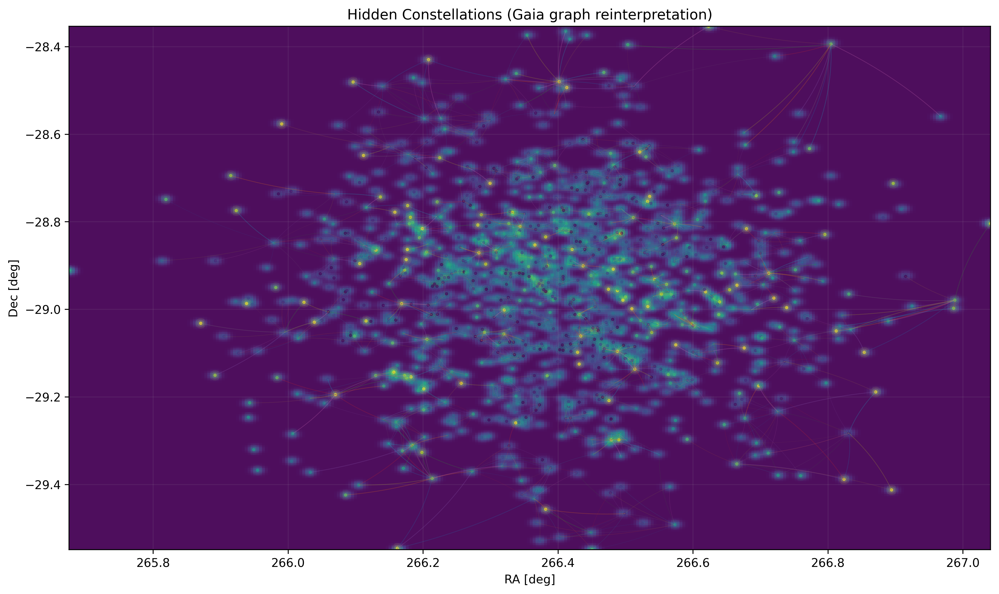

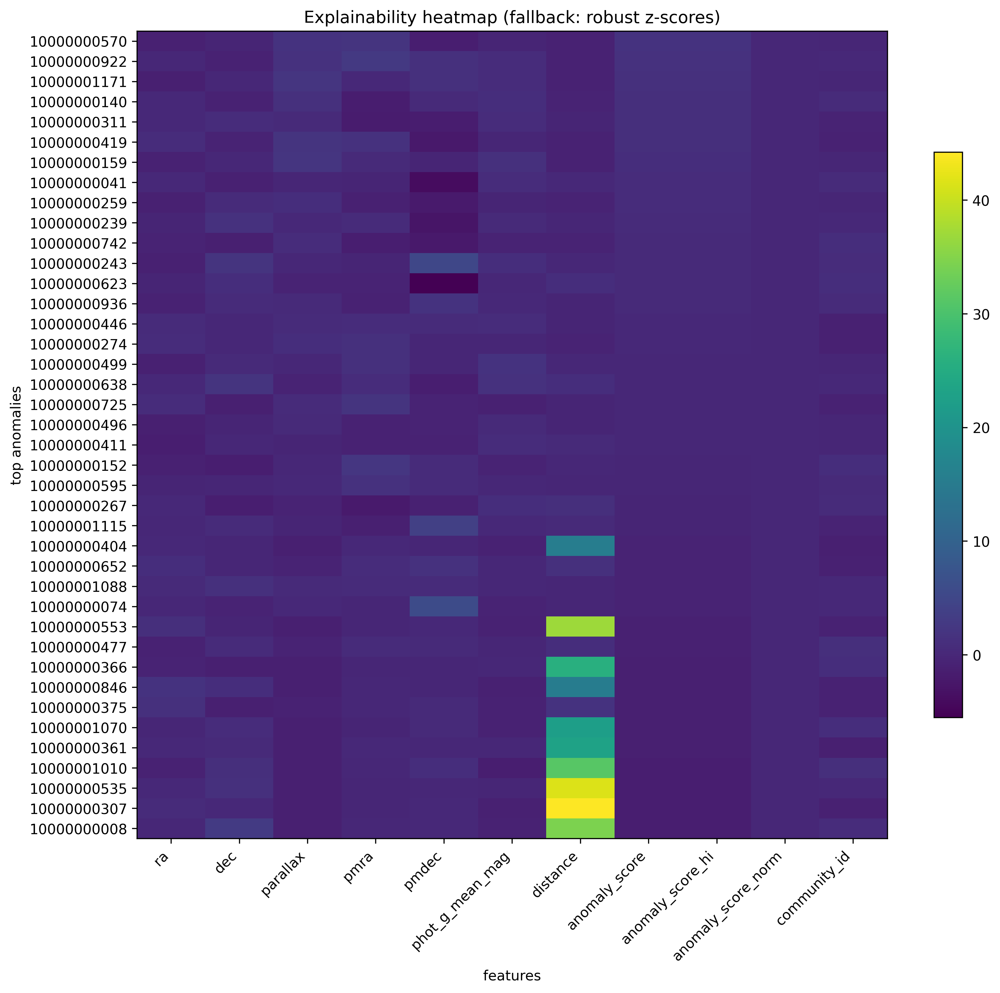

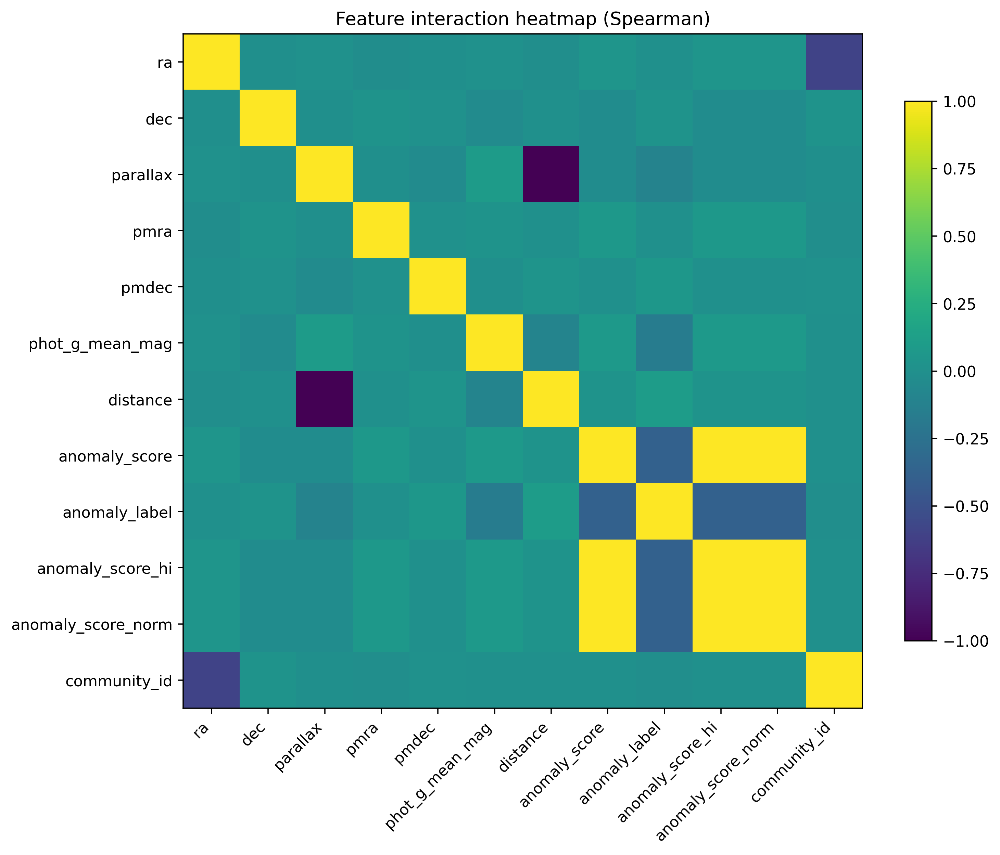

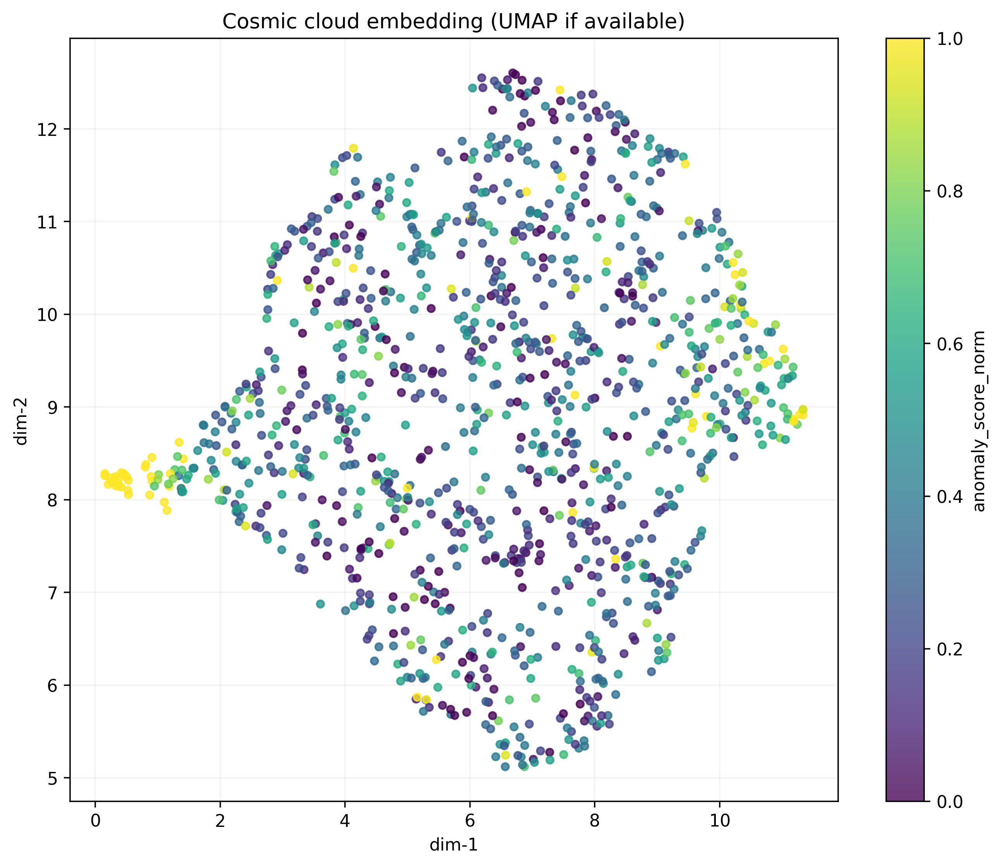

Open dashboard: results/run_csv/viz_a_to_h/06_explorer_dashboard.html


In [13]:
# 3) Preview key artifacts
from pathlib import Path
from IPython.display import Image, display
p = Path('results/run_csv/viz_a_to_h')

png_files = sorted(list(p.glob('*.png')))

if png_files:
    for f in png_files:
        display(Image(filename=str(f)))
else:
    print(f"No PNG files found in {p}")

print('Open dashboard:', p/'06_explorer_dashboard.html')